In [2]:
# For data analysis
import pandas as pd
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 5)
pd.set_option('display.max_colwidth', None)
# For rendering animations inline
from IPython.display import HTML
# For plotting
import matplotlib
matplotlib.use('Agg')
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.animation as animation
# For DICOM files
import pydicom
# For manipulating arrays
import numpy as np
# For handling files
import os
# For finding the median
import statistics
from PIL import Image

In [3]:
# The input files
CLINICAL_FILE = 'HNSCC-Clinical-Data.csv'
TREATMENT_FILE = 'Patient-and-Treatment-Characteristics.xls'
DESCRIPTION_FILE = 'Field-Descriptions-for-Patient-and-Treatment-Characteristics.xlsx'

# The description of various relevant clinical data
clinical_data = pd.read_csv(CLINICAL_FILE).sort_values(by=['TCIA Radiomics ID'])
# The descriptions of treatment dates and modalities
treatment_data = pd.read_excel(TREATMENT_FILE).sort_values(by=['TCIA code'])
# The descriptions of all the variables
description_data = pd.read_excel(DESCRIPTION_FILE)

<ipython-input-3-730e1384e035>:11: FutureWarning: Your version of xlrd is 1.2.0. In xlrd >= 2.0, only the xls format is supported. As a result, the openpyxl engine will be used if it is installed and the engine argument is not specified. Install openpyxl instead.
  description_data = pd.read_excel(DESCRIPTION_FILE)


In [18]:
treatment_data['Site'].value_counts()

Oropharynx     156
Glottis        24 
Hypopharynx    12 
Oral cavity    8  
Nasopharynx    6  
CUP            6  
Sinus          3  
Name: Site, dtype: int64

In [ ]:
# See what we data we can match
clinical_IDs = set(clinical_data['TCIA Radiomics ID'].tolist())
print('Number of clinical IDs: {}'.format(len(clinical_IDs)))
treatment_IDs = set(treatment_data['TCIA code'].tolist())
print('Number of treatment IDs: {}'.format(len(treatment_IDs)))
both_IDs = clinical_IDs & treatment_IDs
print('Number of both IDs: {}'.format(len(both_IDs)))

Number of clinical IDs: 492
Number of treatment IDs: 215
Number of both IDs: 80


In [ ]:
# Find the description of a treatment variable here
VARIABLE_NAME = 'Received Feeding Tube (Y/N)'
# print(all_variables = description_data['Data Category'].tolist())
display(description_data.loc[description_data['Data Category'] == VARIABLE_NAME])

,Data Category,Description
41,Received Feeding Tube (Y/N),Receipt of feeding tube during RT


In [ ]:
# Extract cohort overview from the treatment data
count_list = {}
variables_to_include = {'Sex',
                        'Age',
                        'Diag',
                        'Survival (months)',
                        'Total RT treatment time (days)',
                        'Survival  (months)',
                        'Alive or Dead',
                        'Cause of Death'}
all_categories = description_data['Data Category'].tolist()
display(all_categories)
for key in all_categories[1:]:
    if key in variables_to_include:
        print('--------------------------------------------')
        print(key)
        print('--------------------------------------------')
        # Sort the index for these categories
        if key == 'Age' or 'Total RT treatment time (days)':
            temp_values = treatment_data[key].value_counts().sort_index(ascending=True)
        else:
            temp_values = treatment_data[key].value_counts()
        display(temp_values)
        count_list[key] = temp_values


['SUBJECT_ID',
 'Sex',
 'Age',
 'Date of Birth',
 'Diag',
 'Site',
 'Histology',
 'Grade',
 'T',
 'N',
 'M',
 'Stage',
 'HPV status',
 'Date of Diagnosis',
 'Last Contact Date',
 'Follow up duration (day)',
 'Follow up duration (year)',
 'Follow up duration (month)',
 'Date of Death',
 'Survival  (months)',
 'Alive or Dead',
 'Cause of Death',
 'Date of recurrence',
 'Disease-free interval (months)',
 'Site of recurrence (Distal/Local/ Locoregional)',
 'Overall Survival Censor',
 'Disease Specific Survival Censor',
 'Loco-regional Control Censor',
 'Oncologic Treatment Summary',
 'Induction Chemotherapy',
 'Chemotherapy Regimen',
 'Platinum-based chemotherapy',
 'Received Concurrent Chemoradiotherapy?',
 'CCRT Chemotherapy Regimen',
 'Surgery Summary',
 'RT Total Dose (Gy)',
 'Dose/Fraction (Gy/fx)',
 'Number of Fractions',
 'Unplanned Additional Oncologic Treatment',
 'Smoking History',
 'Current Smoker',
 'Received Feeding Tube (Y/N)',
 'Type of feeding tube',
 'Date Feeding tube pla

--------------------------------------------
Sex
--------------------------------------------


Female    33 
Male      182
Name: Sex, dtype: int64

--------------------------------------------
Age
--------------------------------------------


24    1
29    1
     ..
81    1
91    1
Name: Age, Length: 46, dtype: int64

--------------------------------------------
Diag
--------------------------------------------


CA BOT                              79
CA alveolar ridge                   1 
                                   .. 
NPC                                 6 
recurrence CA retromolar trigone    1 
Name: Diag, Length: 19, dtype: int64

--------------------------------------------
Survival  (months)
--------------------------------------------


6.333333      1
8.100000      1
             ..
116.449315    1
118.933333    1
Name: Survival  (months), Length: 209, dtype: int64

--------------------------------------------
Alive or Dead
--------------------------------------------


Alive    138
Dead     77 
Name: Alive or Dead, dtype: int64

--------------------------------------------
Cause of Death
--------------------------------------------


Alive           138
HN Cancer       52 
                .. 
Other cancer    4  
Unknown         9  
Name: Cause of Death, Length: 6, dtype: int64

--------------------------------------------
Total RT treatment time (days)
--------------------------------------------


23    2
24    1
     ..
49    2
51    1
Name: Total RT treatment time (days), Length: 21, dtype: int64

In [5]:
# Plot stuff here

# 1. Plot the cummulative survival for both alive and dead patients
key = 'Survival  (months)'
ad_data = treatment_data['Alive or Dead']
alive_filter = (ad_data=='Alive')
dead_filter = (ad_data=='Dead')
alive_data = treatment_data[key][alive_filter].sort_values()
dead_data = treatment_data[key][dead_filter].sort_values()

fig = plt.figure()
x_alive_data = pd.Series(alive_data.values).div(12)
y_alive_data = alive_data.cumsum().div(alive_data.sum()/100)
plt.plot(x_alive_data, y_alive_data, label = 'Alive')
x_dead_data = pd.Series(dead_data.values).div(12)
y_dead_data = dead_data.cumsum().div(dead_data.sum()/100)
plt.plot(x_dead_data, y_dead_data, label = 'Dead')
fig.suptitle('Cummulative Patients (%) vs. Survival (years)', fontsize=14)
plt.xlabel('Survival (years)', fontsize=12)
plt.ylabel('Cummulative Patients (%)', fontsize=12)
plt.xticks(np.arange(0, max(x_dead_data)+1, 1.0))
plt.legend()
plt.show()

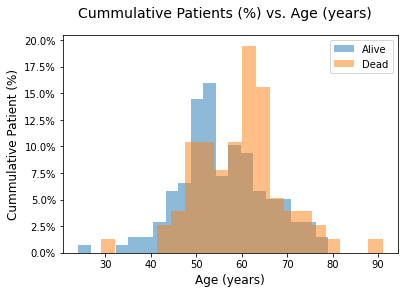

In [ ]:
# 2. Plot the distribution of ages
key = 'Age'
alive_data = pd.Series(treatment_data[key][alive_filter].sort_values()).values
dead_data = pd.Series(treatment_data[key][dead_filter].sort_values()).values

fig = plt.figure()
nbins = 20
alive_weights=np.ones(len(alive_data)) / len(alive_data)
plt.hist(alive_data, bins=nbins, alpha=0.5, weights=alive_weights, label='Alive')
dead_weights=np.ones(len(dead_data)) / len(dead_data)
plt.hist(dead_data, bins=nbins, alpha=0.5, weights=dead_weights, label='Dead')
fig.suptitle('Cummulative Patients (%) vs. Age (years)', fontsize=14)
plt.xlabel('Age (years)', fontsize=12)
plt.ylabel('Cummulative Patient (%)', fontsize=12)
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.legend()
plt.show()

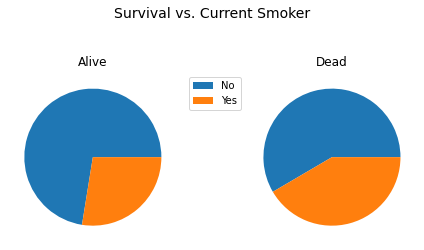

In [ ]:
# 3. Plot the distribution of survival for current smoker
key = 'Current Smoker'
labels = ['No', 'Yes']
x_alive_data = treatment_data[key][alive_filter].value_counts().values
x_dead_data = treatment_data[key][dead_filter].value_counts().values

fig = plt.figure()
plt.subplot(1,2,1)
plt.title('Alive')
plt.pie(x_alive_data, labels=None)
plt.subplot(1,2,2)
plt.title('Dead')
plt.pie(x_dead_data, labels=None)
fig.suptitle('Survival vs. Current Smoker', fontsize=14)
plt.legend(labels, bbox_to_anchor=(0, 1))
plt.tight_layout()
plt.show()

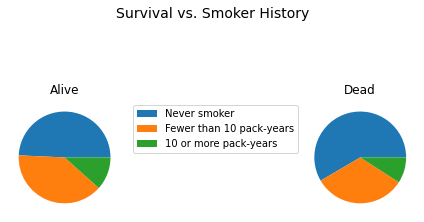

In [ ]:
# 4. Plot the distribution of survival for smoker history
key = 'Smoking History'
labels = ['Never smoker', 'Fewer than 10 pack-years', '10 or more pack-years']
x_alive_data = treatment_data[key][alive_filter].value_counts().values
x_dead_data = treatment_data[key][dead_filter].value_counts().values

fig = plt.figure()
plt.subplot(1,2,1)
plt.title('Alive')
plt.pie(x_alive_data, labels=None)
plt.subplot(1,2,2)
plt.title('Dead')
plt.pie(x_dead_data, labels=None)
fig.suptitle('Survival vs. Smoker History', fontsize=14)
plt.legend(labels, bbox_to_anchor=(0, 1))
plt.tight_layout()
plt.show()

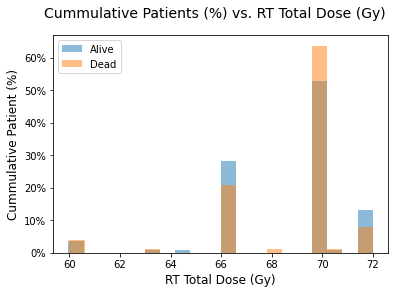

In [ ]:
# 5. Plot the cummulative survival for both alive and dead patients
key = 'RT Total Dose (Gy)'
alive_data = pd.Series(treatment_data[key][alive_filter].sort_values()).values
dead_data = pd.Series(treatment_data[key][dead_filter].sort_values()).values

fig = plt.figure()
nbins = 20
plt.hist(alive_data, weights=np.ones(len(alive_data))/len(alive_data),
         bins=nbins, alpha=0.5, label='Alive')
plt.hist(dead_data, weights=np.ones(len(dead_data))/len(dead_data),
         bins=nbins, alpha=0.5, label='Dead')
fig.suptitle('Cummulative Patients (%) vs. RT Total Dose (Gy)', fontsize=14)
plt.xlabel('RT Total Dose (Gy)', fontsize=12)
plt.ylabel('Cummulative Patient (%)', fontsize=12)
plt.legend()
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.show()


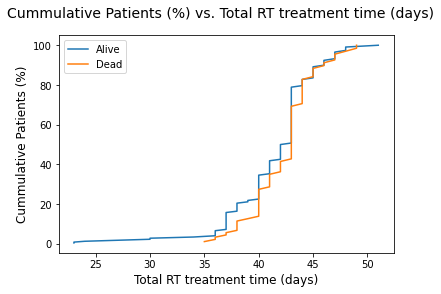

In [ ]:
# 6. Plot the RT treatment time for both alive and dead patients
key = 'Total RT treatment time (days)'
ad_data = treatment_data['Alive or Dead']
alive_filter = (ad_data=='Alive')
dead_filter = (ad_data=='Dead')
alive_data = treatment_data[key][alive_filter].sort_values()
dead_data = treatment_data[key][dead_filter].sort_values()

fig = plt.figure()
x_alive_data = pd.Series(alive_data.values)
y_alive_data = alive_data.cumsum().div(alive_data.sum()/100)
plt.plot(x_alive_data, y_alive_data, label = 'Alive')
x_dead_data = pd.Series(dead_data.values)
y_dead_data = dead_data.cumsum().div(dead_data.sum()/100)
plt.plot(x_dead_data, y_dead_data, label = 'Dead')
fig.suptitle('Cummulative Patients (%) vs. Total RT treatment time (days)', fontsize=14)
plt.xlabel('Total RT treatment time (days)', fontsize=12)
plt.ylabel('Cummulative Patients (%)', fontsize=12)
plt.legend()
plt.show()

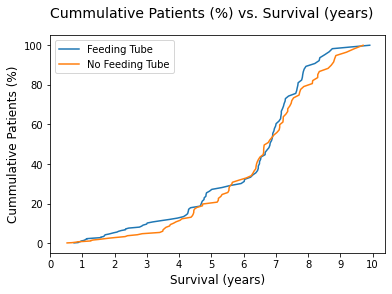

In [ ]:
# 7. Plot the distribution of survival based on feeding tube
key = 'Survival  (months)'
ad_data = treatment_data['Received Feeding Tube (Y/N)']
tube_filter = (ad_data=='Yes')
no_tube_filter = (ad_data=='No')
tube_data = treatment_data[key][tube_filter].sort_values()
no_tube_data = treatment_data[key][no_tube_filter].sort_values()

fig = plt.figure()
x_alive_data = pd.Series(tube_data.values).div(12)
y_alive_data = tube_data.cumsum().div(tube_data.sum()/100)
plt.plot(x_alive_data, y_alive_data, label = 'Feeding Tube')
x_dead_data = pd.Series(no_tube_data.values).div(12)
y_dead_data = no_tube_data.cumsum().div(no_tube_data.sum()/100)
plt.plot(x_dead_data, y_dead_data, label = 'No Feeding Tube')
fig.suptitle('Cummulative Patients (%) vs. Survival (years)', fontsize=14)
plt.xlabel('Survival (years)', fontsize=12)
plt.ylabel('Cummulative Patients (%)', fontsize=12)
plt.xticks(np.arange(0, max(x_dead_data)+1, 1.0))
plt.legend()
plt.show()

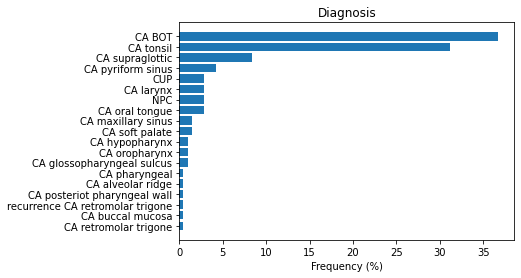

In [ ]:
# 8. Plot the frequency of each diagnosis
y_value = treatment_data['Diag'].value_counts()
y_value = y_value.div(y_value.values.sum()/100)
y_pos = y_value.index

fig, ax = plt.subplots()
ax.barh(y_pos, y_value, align='center')
ax.set_yticks(y_pos)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Frequency (%)')
ax.set_title('Diagnosis')
plt.show()

In [ ]:
# Read, view, and animate CT files
FOLDER_PATH = os.path.join(
    'data',
    'HNSCC-01-0002',
    '10-01-2001-PET CT SKULL TO MID TH-45855',
    '2.000000-CT Atten Cor Head IN-80757'
)
all_dicom = os.listdir(FOLDER_PATH)

fig = plt.figure()
# Get all of the DICOM files in the directory
files = []
for dc in all_dicom:
    FULL_PATH = os.path.join(FOLDER_PATH, dc)
    ds = pydicom.dcmread(FULL_PATH)
    if hasattr(ds, 'SliceLocation'):
        files.append(ds)

# Sort the DICOM into the correct order
slices = sorted(files, key=lambda s: s.SliceLocation)

# Plot the DICOM for each sorted file
images = []
for s in slices:
    images.append([
        plt.imshow(s.pixel_array,
                   cmap=plt.cm.gray,
                   animated=True)
    ])

# Create the animation
im_ani = animation.ArtistAnimation(fig,
                                   images,
                                   interval=50,
                                   repeat_delay=3000,
                                   blit=True)
# Save as a GIF if desired
# im_ani.save('CT_{}.gif'.format(FOLDER_PATH.replace(os.sep,'__')),
#             writer='Pillow',
#             fps=20)
plt.close()

In [ ]:
# Render the animation in the notebook if desired
HTML(im_ani.to_jshtml())

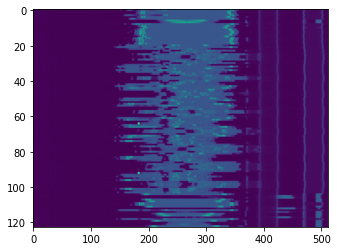

In [19]:
# Determine the ROI of the slices

# Load the DICOM files
files = []
project_path = os.path.join(
   'data'
)
# dir_name = os.path.join(
#     project_path,
#     'HNSCC-01-0001',
#     '12-01-1998-PETCT HEAD  NECK CA-92442',
#     '2.000000-CT Atten Cor Head IN-25068'
# )
dir_name = os.path.join(
    project_path,
    'HNSCC-01-0002',
    '11-20-2001-RT SIMULATION-57976',
    '2.000000-57922'
)
# dir_name = os.path.join(
#     project_path,
#     'HNSCC-01-0001',
#     '12-01-1998-PETCT HEAD  NECK CA-92442',
#     # '2.000000-CT Atten Cor Head IN-25068'
#     # '4.000000-PET AC-13575'
#     # '5.000000-PET NO AC-29271'
#     '601.000000-PETCoronal-08612'
# )
# dir_name = os.path.join(
#     project_path,
#     'HNSCC-01-0001',
#     '12-01-1998-PETCT HEAD  NECK CA-92442',
#     # '2.000000-CT Atten Cor Head IN-25068'
#     # '4.000000-PET AC-13575'
#     # '5.000000-PET NO AC-29271'
#     '601.000000-PETCoronal-08612'
# )
for fname in os.listdir(dir_name):
    ds = pydicom.dcmread(os.path.join(dir_name,fname))
    # if hasattr(ds, 'SliceLocation'):
    files.append(ds)

# Ensure they are in the correct order
# slices = sorted(files, key=lambda s: s.SliceLocation)
slices = files

# Get the pixel aspects, assuming all slices are the same
ps = slices[0].PixelSpacing
ss = slices[0].SliceThickness
ax_aspect = ps[1]/ps[0]
sag_aspect = ps[1]/ss
cor_aspect = ss/ps[0]

# Create 3D array
img_shape = list(slices[0].pixel_array.shape)
img_shape.append(len(slices))
img3d = np.zeros(img_shape)

# Fill 3D array with the images from the files
for i,s in enumerate(slices):
    img2d = s.pixel_array
    img3d[:, :, i] = img2d

# Display stacked slices
ax = plt.subplot()
plt.imshow(np.flipud(img3d[:, img_shape[1]//2, :].T))
# plt.imshow(np.flipud(img3d[img_shape[0]//2, :, :].T))
ax.set_aspect(cor_aspect)

plt.show()

In [6]:
def load_scan(path):
    slices = [pydicom.dcmread(path + os.sep + s) for s in               
              os.listdir(path)]
    slices = [s for s in slices if 'SliceLocation' in s]
    slices.sort(key = lambda x: int(x.InstanceNumber))
    try:
        slice_thickness = np.abs(slices[0].ImagePositionPatient[2] -
                                 slices[1].ImagePositionPatient[2])
    except:
        slice_thickness = np.abs(slices[0].SliceLocation -
                                 slices[1].SliceLocation)
    for s in slices:
        s.SliceThickness = slice_thickness
    return slices

def get_pixels_hu(scans):
    image = np.stack([s.pixel_array for s in scans])
    image = image.astype(np.int16)    
    return np.array(image, dtype=np.int16)

In [8]:
# Decide what to do with the full body scans
full_body = [
    'data/HNSCC-01-0010/03-30-2009-RT SIMULATION-52386/10.000000-61881',
    'data/HNSCC-01-0005/01-19-1998-RT SIMULATION-39358/10.000000-79230',
    'data/HNSCC-01-0008/05-14-1997-RT SIMULATION-54670/10.000000-96097',
    'data/HNSCC-01-0006/06-09-1997-RT SIMULATION-57410/10.000000-41643'
]
# Get all of the RT Sim CT paths then their shapes
all_shapes = {}
all_patients = os.listdir('data')
all_patients = [p for p in all_patients if '.DS_Store' not in p]
new_patients = []
for p in all_patients:
    # HNSCC-01-0001
    patient_dir = os.path.join('data', p)
    scan_dates = [d for d in os.listdir(patient_dir) if 'RT' in d]
    scan_dates = [d for d in scan_dates if '.DS_Store' not in d]
    # Some patients have multiple scans, the first should be the best
    if len(scan_dates) > 1:
        scan_dates = scan_dates[:1]
    for s in scan_dates:
        all_files = os.listdir(os.path.join('data', p, s))
        all_files.sort()
        ct_file = all_files[-1]
        path = os.path.join('data', p, s, ct_file)
        if path in full_body:
            pass
        else:
            try:
                patient_dicom = load_scan(path)
                patient_pixels = get_pixels_hu(patient_dicom)
                all_shapes[path] = patient_pixels.shape
                new_patients.append(p)
            except:
                pass

In [9]:
# Get the distribution of number of axial slices
# plt.hist([s[0] for s in all_shapes.values()])
# plt.show()
unique_vals = np.sort(np.array(list(set([s[0] for s in all_shapes.values()]))))
display(np.mean(unique_vals))
display(np.median(unique_vals))
# Get the number of final alive and dead patient outcomes
temp_df = treatment_data[treatment_data['TCIA code'].isin(new_patients)]
display(temp_df[temp_df['Alive or Dead'] == 'Alive'].shape[0])
display(temp_df[temp_df['Alive or Dead'] == 'Dead'].shape[0])

139.91304347826087

141.0

117

65

In [5]:
# Largest
# path = os.path.join(
#     'data',
#     'HNSCC-01-0010',
#     '03-30-2009-RT SIMULATION-52386',
#     '10.000000-61881'
# )
# Smallest
# path = os.path.join(
#     'data',
#     'HNSCC-01-0134',
#     '05-22-2000-RT SIMULATION-24218',
#     '10.000000-43313'
# )
# all_shapes_test = {
#     os.path.join(
#         'data',
#         'HNSCC-01-0010',
#         '03-30-2009-RT SIMULATION-52386',
#         '10.000000-61881'
#     ): []
# }

# Find a better way to flip some of these images to the correct orientation
flip_array = ['data/HNSCC-01-0199/10-26-2002-RT SIMULATION-18560/3.000000-58373',
              'data/HNSCC-01-0018/03-01-2009-RT SIMULATION-16942/10.000000-60812',
              'data/HNSCC-01-0011/11-11-1997-RT SIMULATION-19590/10.000000-88887',
              'data/HNSCC-01-0016/03-07-1998-RT SIMULATION-64055/10.000000-15759',
              'data/HNSCC-01-0086/07-03-1999-RT SIMULATION-42088/92691',
              'data/HNSCC-01-0017/05-04-1998-RT SIMULATION-38793/10.000000-76074',
              'data/HNSCC-01-0010/03-30-2009-RT SIMULATION-52386/10.000000-61881',
              'data/HNSCC-01-0214/07-27-2004-RT SIMULATION-67763/3.000000-43635',
              'data/HNSCC-01-0004/08-24-1996-RT SIMULATION-72882/10.000000-74926',
              'data/HNSCC-01-0201/10-21-2002-RT SIMULATION-79781/2.000000-47027',
              'data/HNSCC-01-0005/01-19-1998-RT SIMULATION-39358/10.000000-79230',
              'data/HNSCC-01-0208/02-02-2003-RT SIMULATION-27554/6.000000-44043',
              'data/HNSCC-01-0183/07-01-2002-RT SIMULATION-37569/3.000000-83360',
              'data/HNSCC-01-0015/02-16-1998-RT SIMULATION-83066/10.000000-53517',
              'data/HNSCC-01-0012/10-11-1997-RT SIMULATION-86133/10.000000-11509',
              'data/HNSCC-01-0013/02-23-1998-RT SIMULATION-65901/10.000000-22461',
              'data/HNSCC-01-0085/09-21-1999-RT SIMULATION-14635/2.000000-33945',
              'data/HNSCC-01-0007/04-29-1997-RT SIMULATION-32176/10.000000-72029',
              'data/HNSCC-01-0009/05-14-1997-RT SIMULATION-35793/10.000000-66060',
              'data/HNSCC-01-0203/12-10-2002-RT SIMULATION-76477/4.000000-83318',
              'data/HNSCC-01-0008/05-14-1997-RT SIMULATION-54670/10.000000-96097',
              'data/HNSCC-01-0006/06-09-1997-RT SIMULATION-57410/10.000000-41643',
              'data/HNSCC-01-0180/05-15-2002-RT SIMULATION-79756/3.000000-98866',
              'data/HNSCC-01-0188/08-13-2002-RT SIMULATION-59772/5.000000-29932',
              'data/HNSCC-01-0175/06-04-2002-RT SIMULATION-40000/3.000000-91467']

with PdfPages('all_slices.pdf') as pdf:
    for i,path in enumerate(all_shapes.keys()):
        patient_dicom = load_scan(path)
        patient_pixels = get_pixels_hu(patient_dicom)
        if path in flip_array:
            patient_pixels = patient_pixels[::-1]
        # Downsample by 2 and get the middle/uppermost 128x128 patch
        patient_pixels = patient_pixels[:,::2,::2]
        patch_size = 128
        middle_slice_x = patient_pixels.shape[1]//2
        start_ind_x = middle_slice_x - patch_size//2
        stop_ind_x = middle_slice_x + patch_size//2
        middle_slice_y = patient_pixels.shape[2]//2
        start_ind_y = middle_slice_y - patch_size//2
        stop_ind_y = middle_slice_y + patch_size//2
        if patient_pixels.shape[0] > patch_size:
            middle_slice_z = patient_pixels.shape[0] - patch_size//2
            start_slice_z = patient_pixels.shape[0] - patch_size
        else:
            middle_slice_z = patient_pixels.shape[0]//2
            start_slice_z = 0
        # Create the figure
        os.makedirs(os.path.join('images',path.split(os.sep)[1]))
        # plt.figure()
        # Axial
        img_data = patient_pixels[middle_slice_z,
                                  start_ind_x:stop_ind_x,
                                  start_ind_y:stop_ind_y]
        img_data = np.pad(img_data,
                          (((patch_size-img_data.shape[0])//2,
                            (patch_size-img_data.shape[0])//2),
                           ((patch_size-img_data.shape[1])//2,
                            (patch_size-img_data.shape[1])//2)),
                          'constant',
                          constant_values=np.min(img_data))
        # plt.subplot(1,3,1)
        fig = plt.figure(figsize=(128/96, 128/96), dpi=96, frameon=False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow(img_data, cmap=plt.cm.bone)
        fig.savefig(os.path.join('images',path.split(os.sep)[1],'axial.jpg'))
        plt.close()
        # Coronal
        img_data = patient_pixels[start_slice_z:,
                                  middle_slice_x,
                                  start_ind_y:stop_ind_y]
        img_data = np.pad(img_data,
                          (((patch_size-img_data.shape[0])//2,
                            (patch_size-img_data.shape[0])//2),
                           ((patch_size-img_data.shape[1])//2,
                            (patch_size-img_data.shape[1])//2)),
                          'constant',
                          constant_values=np.min(img_data))
        # plt.subplot(1,3,2)
        # plt.title(path, fontsize=10)
        fig = plt.figure(figsize=(128/96, 128/96), dpi=96, frameon=False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow(img_data, cmap=plt.cm.bone)
        fig.savefig(os.path.join('images',path.split(os.sep)[1],'coronal.jpg'))
        plt.close()
        # Sagittal
        img_data = patient_pixels[start_slice_z:,
                                  start_ind_x:stop_ind_x,
                                  middle_slice_y]
        img_data = np.pad(img_data,
                          (((patch_size-img_data.shape[0])//2,
                            (patch_size-img_data.shape[0])//2),
                           ((patch_size-img_data.shape[1])//2,
                            (patch_size-img_data.shape[1])//2)),
                          'constant',
                          constant_values=np.min(img_data))
        # plt.subplot(1,3,3)
        # plt.tight_layout()
        # pdf.savefig()
        fig = plt.figure(figsize=(128/96, 128/96), dpi=96, frameon=False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow(img_data, cmap=plt.cm.bone)
        fig.savefig(os.path.join('images',path.split(os.sep)[1],'sagittal.jpg'))
        plt.close()

In [4]:
scan_count = {
    'pet': [],
    'ct': [],
    'mri': [],
    'rt': []
}
pet_scans = 0
ct_scans = 0
mri_scans = 0
rt_scans = 0
all_scan_dates = []
all_scans = []


all_patients = os.listdir('data')
all_patients.remove('.DS_Store')
for p in all_patients:
    # HNSCC-01-0001
    patient_dir = os.path.join('data', p)
    scan_dates = [d for d in os.listdir(patient_dir) if 'RT' not in d]
    scan_dates = [d for d in os.listdir(patient_dir) if '.DS_Store' not in d]
    # Some patients have multiple scans, the first should be the best
    if len(scan_dates) > 1:
        scan_dates = scan_dates[:1]
    all_scan_dates.extend(scan_dates)
    for s in scan_dates:
        # 5.000000-PET AC-61630
        if 'pet' in s.lower():
            pet_scans += 1
            scan_count['pet'].append(s)
        if 'ct' in s.lower():
            ct_scans += 1
            scan_count['ct'].append(s)
        if 'mri' in s.lower():
            mri_scans += 1
            scan_count['mri'].append(s)
        if 'rt' in s.lower():
            rt_scans += 1
            scan_count['rt'].append(s)

    for i,d in enumerate(scan_dates):
        # 03-27-1999-PETCT HEAD  NECK CA-14500
        date = '-'.join(d.split('-')[:3])
        scan_count[date] = []
        scan_dir = os.path.join(patient_dir, d)
        scans = os.listdir(scan_dir)
        all_scans.extend(scans)


display('PET: {}'.format(pet_scans))
display('CT: {}'.format(ct_scans))
display('MRI: {}'.format(mri_scans))
display('RT: {}'.format(rt_scans))
display(len(all_scan_dates))
display(len(all_scans))
display(scan_count['mri'])

'PET: 537'

'CT: 506'

'MRI: 5'

'RT: 206'

781

3226

['06-17-2003-MRI ORBFACEANDOR NECK WWO C-19219',
 '03-25-2000-MRI ORBFACEANDOR NECK WWO C-35339',
 '05-22-2000-MRI ORBFACEANDOR NECK WWO C-31755',
 '08-27-2002-MRI ORBFACEANDOR NE-89602',
 '10-19-2004-MRI ORBFACEANDOR NE-75029']

In [262]:
# Determine the mean and median survival
key = 'Survival  (months)'
ad_data = treatment_data['Alive or Dead']
alive_filter = (ad_data=='Alive')
dead_filter = (ad_data=='Dead')
alive_data = treatment_data[key][alive_filter].sort_values()
dead_data = treatment_data[key][dead_filter].sort_values()
alive_data = alive_data.tolist()
dead_data = dead_data.tolist()
display(f'Alive (mean): {np.mean(alive_data)/12}')
display(f'Alive (median): {statistics.median(alive_data)/12}')
display(f'Dead (mean): {np.mean(dead_data)/12}')
display(f'Dead (median): {statistics.median(dead_data)/12}')

'Alive (mean): 6.265053603385265'

'Alive (median): 6.697222222083333'

'Dead (mean): 3.3015759354913423'

'Dead (median): 2.706849315'

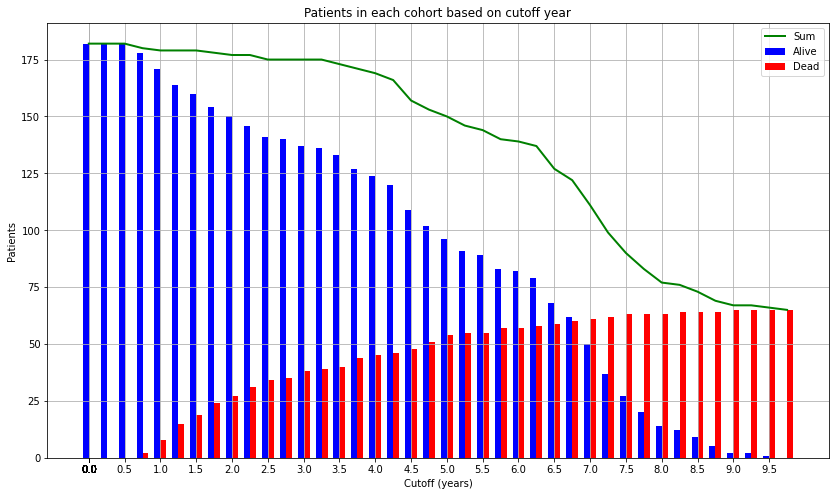

In [64]:
# Count everyone that died within (<=) X years as 1 (dead)
# Count everyone that died after X years and is alive >X years as 0 (alive)
# Discard alive patients with less than X years follow-up
key = 'Survival  (months)'
treatment_data = treatment_data[treatment_data['TCIA code'].isin(new_patients)]
ad_data = treatment_data['Alive or Dead']
sv_data = treatment_data[key]
alive_filter = (ad_data=='Alive')
dead_filter = (ad_data=='Dead')
alive_data = treatment_data[key][alive_filter].sort_values()/12
dead_data = treatment_data[key][dead_filter].sort_values()/12

plot_alive = []
plot_dead = []
indices = np.arange(0,10,0.25)
for c in indices:
    alive_over_data = alive_data[sv_data > c*12]
    dead_under_data = dead_data[sv_data <= c*12]
    dead_over_data = dead_data[sv_data > c*12]
    plot_alive.append(len(alive_over_data.append(dead_over_data)))
    plot_dead.append(len(dead_under_data))
plot_sum = [sum(i) for i in zip(plot_alive, plot_dead)]

# Plot the results
width = np.min(np.diff(indices))/3
fig = plt.figure(figsize=(14,8))
ax = fig.add_subplot(111)
ax.bar(indices-width/2, plot_alive, width, color='b', label='Alive')
ax.bar(indices+width/2, plot_dead, width, color='r', label='Dead')
ax.plot(indices, plot_sum, linewidth=2, color='g')
ax.legend(['Sum','Alive','Dead'])
ax.set_xticks([i if i%0.5==0 else 0 for i in indices])
ax.set_xlabel('Cutoff (years)')
ax.set_ylabel('Patients')
ax.set_title('Patients in each cohort based on cutoff year')
ax.grid(True)
plt.savefig('Patient_Cohort_Cutoff.jpg')
plt.show()

In [68]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    df = pd.DataFrame({
        'Cutoff Year': indices,
        'Alive': plot_alive,
        'Dead': plot_dead,
        'Sum': plot_sum
    })
    display(df)
df.to_csv('Cutoff_Year.csv', index=False)

,Cutoff Year,Alive,Dead,Sum
0,0.00,182,0,182
1,0.25,182,0,182
2,0.50,182,0,182
3,0.75,178,2,180
4,1.00,171,8,179
5,1.25,164,15,179
6,1.50,160,19,179
7,1.75,154,24,178
8,2.00,150,27,177
9,2.25,146,31,177
